<a href="https://colab.research.google.com/github/dariakrtn/AI_2022/blob/main/CW_AI_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#***MPI Sintel***



> ***MPI (Max Planck Institute)*** - это набор данных для оценки оптического потока, который содержит 1064 синтезированных стереоизображения и данные о достоверности на основе несоответствий.

Sintel является производным от 3D анимационного короткометражного фильма Sintel с открытым исходным кодом. Набор данных содержит 23 различных сцены. Стереоизображения имеют цвет RGB, а несоответствие - оттенки серого. Оба имеют разрешение 1024 × 436 пикселей и 8 бит на канал.

##*Распределние данных*

### Все данные доступны на веб-сайте [MPI-Sintel Flow](http://sintel.is.tue.mpg.de/). 
Из полного фильма выбрали 35 клипов. Помимо шести более коротких последовательностей действий, каждая последовательность имеет длину 50 кадров, что дает 49 полей потока в клипе.

Эти клипы были разделены на обучающий набор из 23 клипов и тестовый набор из 12 клипов. Набор тестов был выбран таким образом, чтобы он был достаточно сложным, но при этом сохранял сходство изображения и статистики потока с обучающим набором. В общей сложности набор данных содержит 1064 обучающих и 564 тестовых кадра. Изображения сохраняются в виде 8-битных PNG-файлов, а частота кадров составляет 24 кадра в секунду. Более подробная информация о создании изображения приведена на [сайте](https://ps.is.mpg.de/publications/butler-supmat-2012). Полный набор данных можно скачать [MPI-Sintel](http://sintel.is.tue.mpg.de/downloads).


## *Про набор данных Sintel*

###  Разработчики выбрали “клипы”, где оптический поток четко определен, а проходы рендеринга интуитивно правильны. 
В нескольких случаях модифицировали параметры рендеринга, чтобы получить результат, подходящий для оценки оптического потока. Например, в оригинальном фильме волосы главного героя представлены в виде системы частиц, что придает им прозрачный вид и затрудняет определение основного потока эталонных данных. В наших рендерах мы заменили такие волосы непрозрачными прядями. Результирующие кадры по-прежнему визуально приятны и похожи на оригинал, но более подходят для оценки потока.


###  В контексте системы оценки открытость данных Sintel становится недостатком. 
Хотя это потребовало бы определенных усилий, злоумышленник мог бы извлечь основной оптический поток истины из доступного данные и представить эту основную истину, таким образом, добившись идеального результата. Чтобы отговорить пользователей от этого, создатели случайным образом изменили геометрию сцены и движение камеры в двух последовательностях из тестового набора. Через каждые 10 кадров добавлялись случайные смещения ∈ [-0,1, +0,1] метровые эквиваленты по всем измерениям местоположения камеры и неподвижных (неживых) объектов. Между ключевыми кадрами местоположения были линейно интерполированы.


### Набор данных потока MPI-Sintel. 

Таким образом, полный общедоступный набор данных включает последовательности изображений для альбедо, чистых и конечных проходов. Кроме того, для обучающего набора предоставляются поля прямого потока (визуализации с плавающей запятой и цветного изображения), маски границ перекрытия, непревзойденные пиксельные маски и недопустимые пиксельные карты. Также предоставляется программное обеспечение для вычисления различной статистики ошибок в обучающих данных (пользователи могут, например, использовать часть обучающих данных для перекрестной проверки).

## *Плюсы MPI Sintel*

Реалистичные фильмы с открытым исходным кодом, такие как Sintel, предоставляют новые возможности для исследований компьютерного зрения. Создатели сосредоточились на оптическом потоке, потому что нет датчика, который обеспечивал бы прямые измерения потока в естественных сценах.

Следовательно, реалистичная графика, возможно, является лучшим решением, доступным на сегодняшний день. Создатели представили тщательно разработанный набор данных для оценки оптического потока и обнаружили, что статистика Sintel аналогична статистике фильмов о природе, что делает его разумным прокси для реальных сцен. Есть несколько способов расширить текущий набор данных. К ним относятся рендеринг сцен с более высоким пространственным и временным разрешением, с различными уровнями размытия при движении, с дополнительными ухудшениями качества, такими как эффекты подвижного затвора, или с помощью виртуальной стереокамеры. 

# ***Optical Flow Estimation*** 

Задача вычисления оптического потока между двумя изображениями (обычно, между соседними кадрами видео) заключается в построении векторного поля $O$ такого же размера, причем $O(i, j)$ будет соответствовать вектору видимого смещения пикселя $(i, j)$ с первого кадра до второго. Построив такое векторное поле между всеми соседними кадрами видео, мы получим полную картину того, как передвигались те или иные объекты на нем. Иными словами, это задача трекинга всех пикселей на видео. Применяется оптический поток чрезвычайно широко — в задачах action recognition, например, такое векторное поле позволяет сконцентрироваться на движениях, происходящих на видео и уйти от его контекста.

![display image](https://habrastorage.org/r/w1560/webt/pf/hx/t6/pfhxt6t_fawwqjyxiptno85zyge.png)

Тут есть место некоторым неоднозначностям — что именно считать видимым смещением с точки зрения математики? Обычно, предполагают что значения пикселей переходят из одного кадра в следующий без изменений, иными словами:
$I(i, j, t) = I(i+u_i, j+u_j, t+1),$

где $I(i, j, t)$ — интенсивность пикселя по координатам $(i, j)$, тогда оптический поток $(u_i, u_j)$ показывает куда сместился этот пиксель в следующий момент времени (т.е. на следующем кадре).

В картинке это выглядит так:

![display image](https://habrastorage.org/webt/55/pv/ql/55pvqliwe25q4uz58mc9vhf5z9m.gif)

Визуализировать векторное поле непосредственно векторами наглядно, но не всегда удобно, поэтому второй распространенный способ — визуализация цветом:

![display image](https://habrastorage.org/webt/eb/lc/a2/eblca2o7vwo_d0wtyw8gm9axdte.gif)

Каждый цвет на этой картинке кодирует определенный вектор. Для простоты, вектора длиннее 20-ти обрезаются, а сам вектор по цвету можно восстановить.

# ***Пример применения готовой модели на MPI Sintel данных***


Присутвует возможность работы как с отдельными изображенияями так и с видео

### Установка и импортирование необходимых модулей

In [ ]:
!wget http://files.is.tue.mpg.de/sintel/MPI-Sintel-complete.zip

--2022-12-23 13:31:11--  http://files.is.tue.mpg.de/sintel/MPI-Sintel-complete.zip
Resolving files.is.tue.mpg.de (files.is.tue.mpg.de)... 192.124.27.148
Connecting to files.is.tue.mpg.de (files.is.tue.mpg.de)|192.124.27.148|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://files.is.tue.mpg.de/sintel/MPI-Sintel-complete.zip [following]
--2022-12-23 13:31:11--  https://files.is.tue.mpg.de/sintel/MPI-Sintel-complete.zip
Connecting to files.is.tue.mpg.de (files.is.tue.mpg.de)|192.124.27.148|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5627783629 (5.2G) [application/zip]
Saving to: ‘MPI-Sintel-complete.zip’

MPI-Sintel-complete 100%[===================>]   5.24G  11.5MB/s    in 6m 39s  

2022-12-23 13:37:51 (13.5 MB/s) - ‘MPI-Sintel-complete.zip’ saved [5627783629/5627783629]



In [ ]:
# !unzip MPI-Sintel-complete.zip

In [ ]:
!pip install perceiver-io[text,vision]==0.7.0
!pip install matplotlib
!pip install termcolor==2.0.1
!pip install "ipywidgets>=7,<8"
!pip3 install --upgrade numpy==1.20.3

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import requests
import torch
from PIL import Image
import os
import pandas as pd
import plotly.express as px
import cv2
from torch.utils.tensorboard import SummaryWriter

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
train_test = ['training']
test_data = []
train_data = []
result = []

for data in train_test:
    tmp = os.listdir(f'./{data}')
    for tmp_data in tmp:
        if tmp_data == '.AppleDouble':
            continue
        else:
            tmp_data_2 = os.listdir(f'./{data}/{tmp_data}')
            count = 0
            for datas in tmp_data_2:
                count += len(os.listdir(f'./{data}/{tmp_data}/{datas}'))
            result.append([f'{tmp_data}', count])
result = pd.DataFrame(result, columns=['dir', 'count'])
fig = px.pie(result, values='count', names='dir', title='Количество картинок в тренировочных наборах данных')
fig.show()

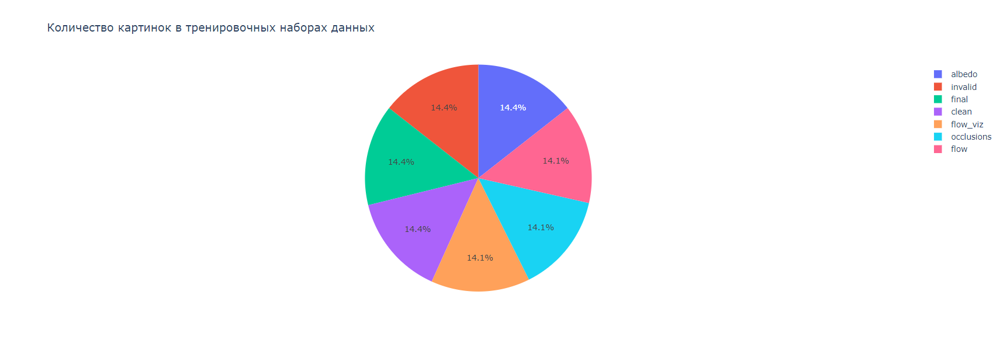

In [ ]:
train_test = ['test']
test_data = []
train_data = []
result = []

for data in train_test:
    tmp = os.listdir(f'./{data}')
    for tmp_data in tmp:
        if tmp_data == '.AppleDouble':
            continue
        else:
            tmp_data_2 = os.listdir(f'./{data}/{tmp_data}')
            count = 0
            for datas in tmp_data_2:
                count += len(os.listdir(f'./{data}/{tmp_data}/{datas}'))
            result.append([f'{tmp_data}', count])
result = pd.DataFrame(result, columns=['dir', 'count'])
fig = px.pie(result, values='count', names='dir', title='Количество картинок в тестовых наборах данных')
fig.show()

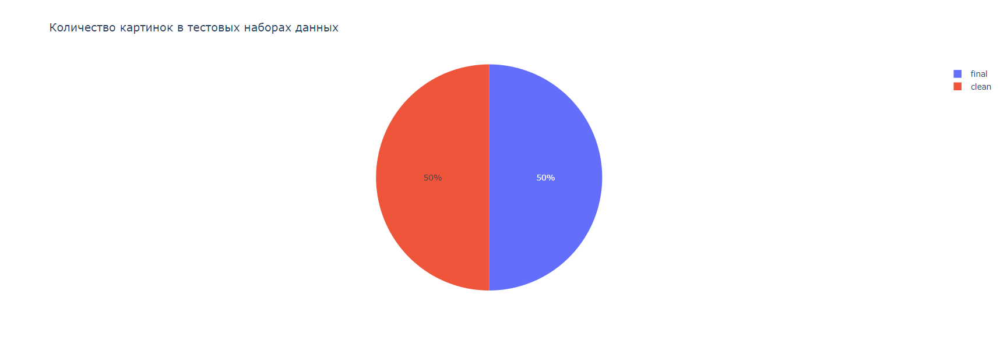

### Optical flow

Модель, используемая в следующих примерах, основана на основной конфигурации из [Perceiver IO paper](https://arxiv.org/abs/2107.14795) для оптического потока (параметры 41 М, размер участка 3x3, объединение кадров, без понижающей выборки). Модель инициализируется с помощью весов, загруженных из Hugging Face Hub.

In [ ]:
from perceiver.model.vision.optical_flow import convert_config, OpticalFlow
from transformers import AutoConfig

device = "cuda" if torch.cuda.is_available() else "cpu"

# Загрузка предобученной модели из Hugging Face Hub
config = AutoConfig.from_pretrained("deepmind/optical-flow-perceiver")

# Преобразование конфигурации, создание экземпляра модели и загрузка весов
model = OpticalFlow(convert_config(config)).eval().to(device)

Downloading:   0%|          | 0.00/914 [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning:

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2895.)



Downloading:   0%|          | 0.00/164M [00:00<?, ?B/s]

#### Optical flow for images

В этом разделе создается оптический поток для двух последовательных видеокадров. Видеокадры взяты из [MPI Sintel Flow dataset](http://sintel.is.tue.mpg.de/) который основан на: [Sintel - анимационный короткометражный мультфильм](https://durian.blender.org/).

In [ ]:
frame1 = Image.open(requests.get("https://martin-krasser.com/perceiver/flow/frame_0047.png", stream=True).raw)
frame2 = Image.open(requests.get("https://martin-krasser.com/perceiver/flow/frame_0048.png", stream=True).raw)

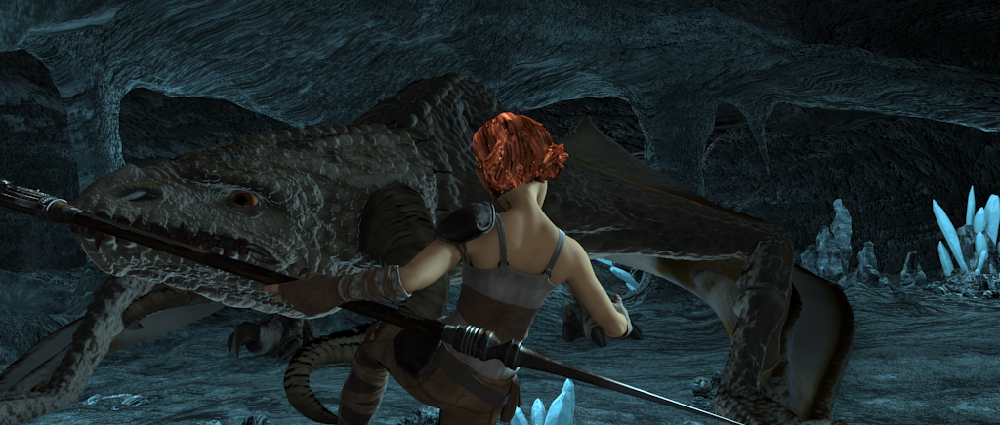

In [ ]:
display(frame1)

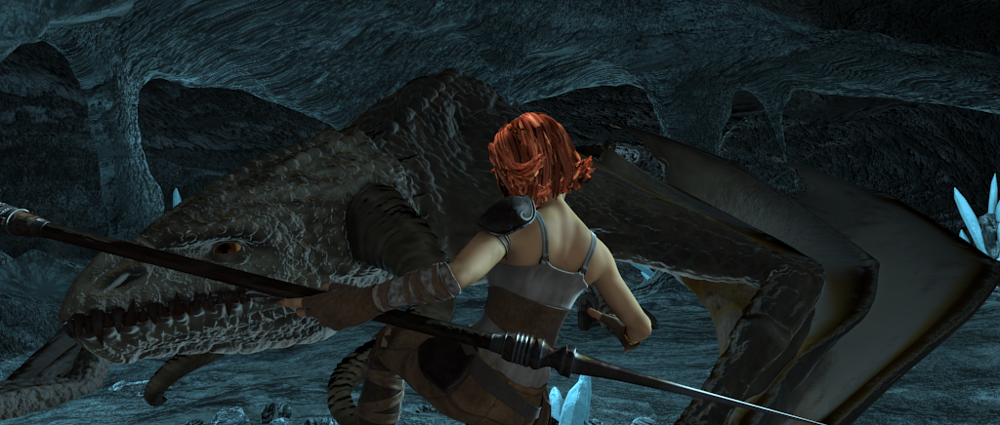

In [ ]:
display(frame2)

Чтобы определить оптический поток между двумя видеокадрами, необходимо выполнить следующие шаги:

- *Pre-processing*: кадры объединяются по размеру канала, и извлекается участок размером 3 x 3 вокруг каждого пикселя. После этого результат разбивается на участки разного размера (высота = 368, ширина = 496).
- *Prediction*: входные патчи, созданные на предыдущем шаге, подаются в модель в виде отдельных примеров, и создается оптический поток для каждого отдельного входного патча.
- *Post-processing*: результирующие выходные патчи объединяются в единый оптический поток.

Эти шаги реализованы в `OpticalFlowProcessor` позволяющий выполнить весь рабочий процесс за один проход с использованием `process` метода.

*Примечание*: чтобы выполнить вышеупомянутые шаги по отдельности, `OpticalFlowProcessor` также предоставляет методы `preprocess` и `postprocess`.

In [ ]:
from perceiver.data.vision.optical_flow import OpticalFlowProcessor

processor = OpticalFlowProcessor(patch_size=tuple(config.train_size))

Для создания оптического потока `process` метод вызывается с помощью `OpticalFlow` модель и пара кадров в качестве входных данных. На выходе получается вектор оптического потока для каждого пикселя, представляющий направление и величину прогнозируемого движения.

In [ ]:
frame_pair = (np.array(frame1), np.array(frame2))

optical_flow = processor.process(model, image_pairs=[frame_pair], batch_size=1, device=device).numpy()[0]
optical_flow.shape

100%|██████████| 1/1 [00:05<00:00,  5.37s/it]


(436, 1024, 2)

Оптический поток визуализируется с использованием представления HSV, где прогнозируемый угол (направление) каждого пикселя изображения представлен значением оттенка, а расстояние (величина) - цветом HSV.

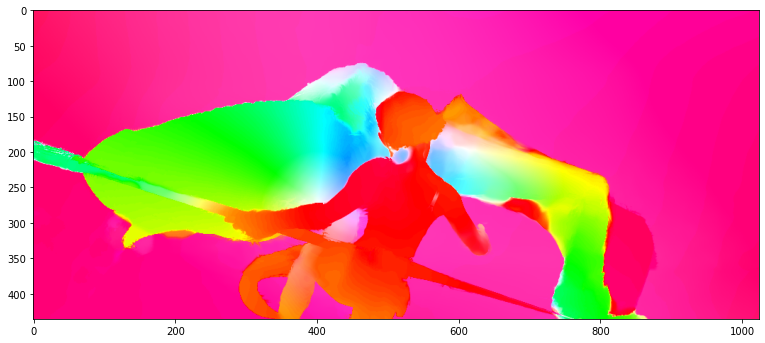

In [ ]:
from perceiver.data.vision.optical_flow import render_optical_flow

plt.figure(figsize = (13, 15))
plt.imshow(render_optical_flow(optical_flow))

#### Optical flow для видео

Для создания оптического потока для всех кадров видеофайла модель оптического потока Perceiver IO может быть использована в сочетании с методами, предоставляемыми `video_utils`.

В следующем разделе показано, как выполнить выборку всех кадров из [video snippet](https://martin-krasser.com/perceiver/flow/sintel_clip_cave_dragon_fight.mp4) взятого из [Sintel animated short movie](https://durian.blender.org/), создаются оптические потоки для каждой пары последовательных кадров и запсываются результаты оптического потока обратно в видеофайл, используя представление HSV.

**Замечание**: запуск нижних ячеек является довольно дорогостоящим с точки зрения вычислительных мощностей, для данного ролика обработка заняла примено 24 минуты.

подгрузка видео

In [ ]:
!curl https://martin-krasser.com/perceiver/flow/sintel_clip_cave_dragon_fight.mp4 --output sintel_clip_cave_dragon_fight.mp4

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 2511k  100 2511k    0     0  1912k      0  0:00:01  0:00:01 --:--:-- 1912k


In [ ]:
from perceiver.data.vision.optical_flow import write_optical_flow_video
from perceiver.data.vision import video_utils
from pathlib import Path

# sample consecutive video frame pairs
frame_pairs = video_utils.read_video_frame_pairs(Path("sintel_clip_cave_dragon_fight.mp4"))

# create optical flow for all frame pairs
optical_flows = processor.process(model, frame_pairs, batch_size=2, device=device)

# create video with optical flows
write_optical_flow_video(Path("sintel_clip_cave_dragon_fight_output.mp4"), optical_flows, fps=24)

100%|██████████| 120/120 [23:25<00:00, 11.72s/it]


![display image](https://martin-krasser.com/perceiver/flow/sintel_clip_cave_dragon_fight_output_side_by_side.gif)

In [ ]:
import torchvision

writer = SummaryWriter('runs/')

for data in train_test:
    tmp = os.listdir(f'./{data}')
    for tmp_data in tmp:
        if tmp_data == '.AppleDouble' or tmp_data == 'flow':
            continue
        else:
            tmp_data_2 = os.listdir(f'./{data}/{tmp_data}')
            count = 0
            for datas in tmp_data_2:
                img_dir = os.listdir(f'./{data}/{tmp_data}/{datas}')
                image = cv2.imread(f'./{data}/{tmp_data}/{datas}/{img_dir[1]}')
                img_grid = torchvision.transforms.functional.to_tensor(image)
                writer.add_image(f'MPI Sintel {datas}', img_grid)


In [ ]:
%load_ext tensorboard

In [ ]:
tensorboard --logdir=runs

<IPython.core.display.Javascript object>

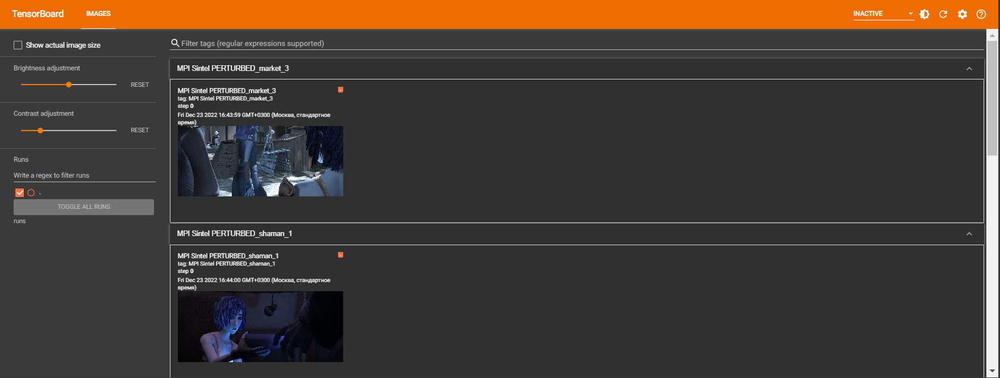

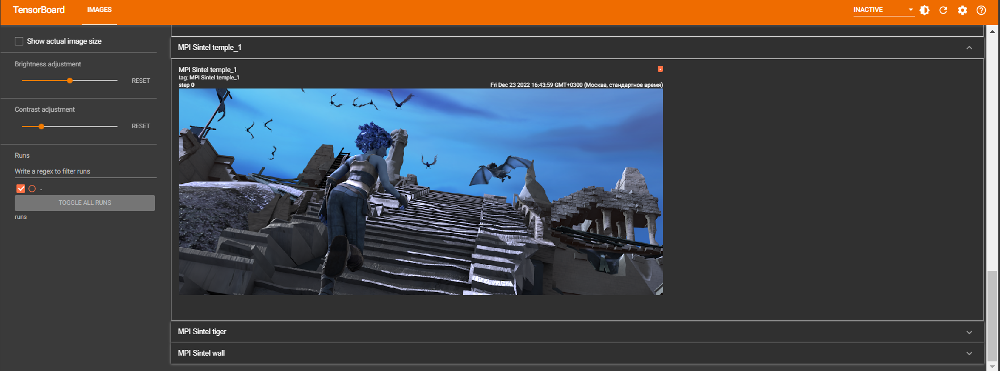

# ***Список литературы***



1.   https://paperswithcode.com/dataset/mpi-sintel
2.   https://link.springer.com/chapter/10.1007/978-3-642-33783-3_44
3.   http://sintel.is.tue.mpg.de/downloads
4.   https://habr.com/ru/company/ods/blog/446726/
5.   https://colab.research.google.com/github/krasserm/perceiver-io/blob/0.7.0/examples/inference.ipynb#scrollTo=41ed665f-6cd8-47ab-ad2a-7b3c05cf4081

